In [103]:
import pandas as pd

import context
import HRI_mapping as mapp

import matplotlib.pyplot as plt
from matplotlib.pylab import savefig
import numpy as np

In [75]:
# get data
exps = ['flat', 'side', 'stand']

data = {}
for exp in exps:
    filename = './data/imu_8_' + exp + '_30min.csv'
    data[exp] = pd.read_csv(filename)

In [ ]:
data

In [77]:
# extract quaternions
# get data

quat = {}

for exp in exps:
    quat[exp] = {}

    for i in range(8):
        idx = i+1
        quat[exp][str(idx)] = data[exp][['quat_x_'+str(idx), 'quat_y_'+str(idx), 'quat_z_'+str(idx), 'quat_w_'+str(idx)]]

In [ ]:
# relativize (not needed)

In [78]:
# remove initial bias

for exp in exps:
    for i in range(8):
        idx = i+1
        quat[exp][str(idx)] = mapp._remove_initial_bias_quaterions(idx, quat[exp][str(idx)])

In [79]:
zz# compute euler angles

for exp in exps:
    for i in range(8):
        idx = i+1
        quat[exp][str(idx)] = mapp._compute_euler_angles(idx, quat[exp][str(idx)])

    # convert them in degrees

    angles = ['roll', 'pitch', 'yaw']

    for angle in angles:

        for i in range(8):
            idx = i+1
            
            quat[exp][str(idx)][angle+'_'+str(idx)] *= 180/np.pi

<Figure size 432x288 with 0 Axes>

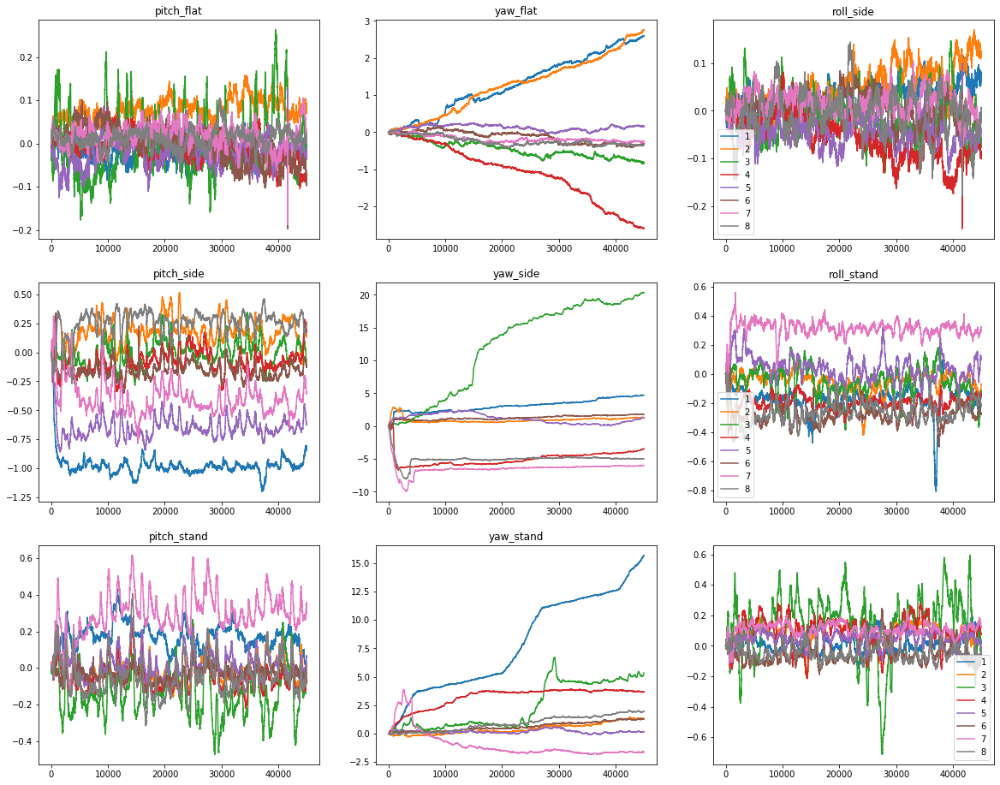

In [105]:
count = 0

plt.figure(figsize=[20,16])
for exp in exps:
    for angle in angles:
        count += 1

        plt.title(angle + '_' + exp)

        for i in range(8):
            idx = i+1
            
            plt.subplot(3,3,count)
            plt.plot(quat[exp][str(idx)][angle+'_'+str(idx)], label = idx)

    plt.legend()
    savefig('data_results.png')